In [1]:
import os
os.environ["KERAS_BACKEND"] = "torch" # alternatively you can use jax or tensorflow as the backend (see installation instructions in keras documentation)
import keras

import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split # helpful for splitting data into training and testing sets
from sklearn.preprocessing import StandardScaler, MinMaxScaler # helpful for scaling data to be between 0 and 1 or have a mean of 0 and standard deviation of 1


In [2]:
file_path = '/Users/ctychen/Desktop/N3AS/spectrum_data/'
#reloading data
parameters = np.concatenate([np.load(file_path + "atm_retr_params_12800_"+str(i)+".npy") for i in range(12)])
spectra_set = np.concatenate([np.load(file_path + "atm_retr_data_12800_"+str(i)+".npy") for i in range(12)])

#take the log of the spectra - seems like this helped a lot with feature identification
spectra_set = np.log(spectra_set)

parameters = parameters[~np.isnan(spectra_set).any(axis=1)]
spectra_set = spectra_set[~np.isnan(spectra_set).any(axis=1)]

print(parameters.shape)
print(spectra_set.shape)

n_samples = parameters.shape[0]
n_features = 947

max_log_flux = np.max(spectra_set, axis=1)
min_log_flux = np.min(spectra_set, axis=1)
spectra_set = (spectra_set - min_log_flux[:, np.newaxis])/(max_log_flux - min_log_flux)[:, np.newaxis]

#splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(parameters, spectra_set, test_size=0.2)

(153590, 16)
(153590, 947)


In [3]:
inp = keras.layers.Input(shape=(n_features,)) # input layer with n_features neurons
x = keras.layers.Dense(512, activation="relu")(inp) 
x = keras.layers.Dense(256, activation="relu")(x) 
x = keras.layers.Dense(128, activation="relu")(x)
x = keras.layers.Dense(32, activation="relu")(x) # (bottleneck layer)
x = keras.layers.Dense(128, activation="relu")(x)
x = keras.layers.Dense(256, activation="relu")(x) 
x = keras.layers.Dense(512, activation="relu")(x)
out = keras.layers.Dense(n_features)(x) # output layer with n_features neurons
autoencoder = keras.models.Model(inp, out) # create model with input and output layers

# compile model
autoencoder.compile(optimizer="adam", loss="mean_squared_error") # use adam optimizer and mean squared error loss function

# print model summary
autoencoder.summary()

# train model with training data and validate with testing data (early stopping is used to avoid overfitting)
history = autoencoder.fit(y_train, y_train, epochs=500, batch_size=32, validation_data=(y_test, y_test),
                callbacks=[keras.callbacks.EarlyStopping(patience=5)]) # this stops training if the validation loss does not decrease for 5 epochs to avoid overfitting

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 947)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       485,376 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │         4,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 947)            │       485,811 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,308,371 (4.99 MB)

 Trainable params: 1,308,371 (4.99 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
3840/3840 ━━━━━━━━━━━━━━━━━━━━ 30s 8ms/step - loss: 0.0083 - val_loss: 5.9573e-04
Epoch 2/500
3840/3840 ━━━━━━━━━━━━━━━━━━━━ 28s 7ms/step - loss: 6.4654e-04 - val_loss: 5.8962e-04
Epoch 3/500
3840/3840 ━━━━━━━━━━━━━━━━━━━━ 29s 8ms/step - loss: 5.1583e-04 - val_loss: 4.2919e-04
Epoch 4/500
3840/3840 ━━━━━━━━━━━━━━━━━━━━ 28s 7ms/step - loss: 4.2126e-04 - val_loss: 6.9177e-04
Epoch 5/500
3840/3840 ━━━━━━━━━━━━━━━━━━━━ 28s 7ms/step - loss: 4.0104e-04 - val_loss: 3.6105e-04
Epoch 6/500
3840/3840 ━━━━━━━━━━━━━━━━━━━━ 29s 8ms/step - loss: 3.6281e-04 - val_loss: 5.7617e-04
Epoch 7/500
3840/3840 ━━━━━━━━━━━━━━━━━━━━ 28s 7ms/step - loss: 3.4806e-04 - val_loss: 3.0261e-04
Epoch 8/500
3840/3840 ━━━━━━━━━━━━━━━━━━━━ 29s 8ms/step - loss: 3.3497e-04 - val_loss: 4.3287e-04
Epoch 9/500
3840/3840 ━━━━━━━━━━━━━━━━━━━━ 29s 8ms/step - loss: 3.1276e-04 - val_loss: 3.1381e-04
Epoch 10/500
3840/3840 ━━━━━━━━━━━━━━━━━━━━ 34s 9ms/step - loss: 2.9919e-04 - val_loss: 3.8989e-04
Epoch 11/500
3840/3840 

In [14]:
dir = '/Users/ctychen/Desktop/N3AS/models/'
autoencoder.save(dir+"autoencoder_512_256_128_32_128_256_512.keras")

In [8]:
figdir = '/Users/ctychen/Desktop/N3AS/figures/'

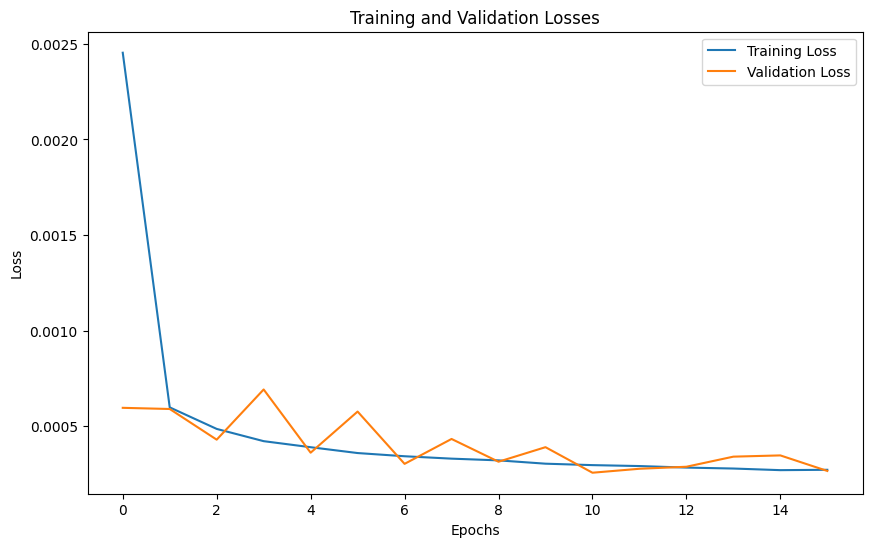

In [9]:
plt.figure(figsize=(10, 6))
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title(f'Training and Validation Losses')
plt.legend()
plt.savefig(figdir + 'autoencoder_loss_512_256_128_32_128_256_512.png')

960/960 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


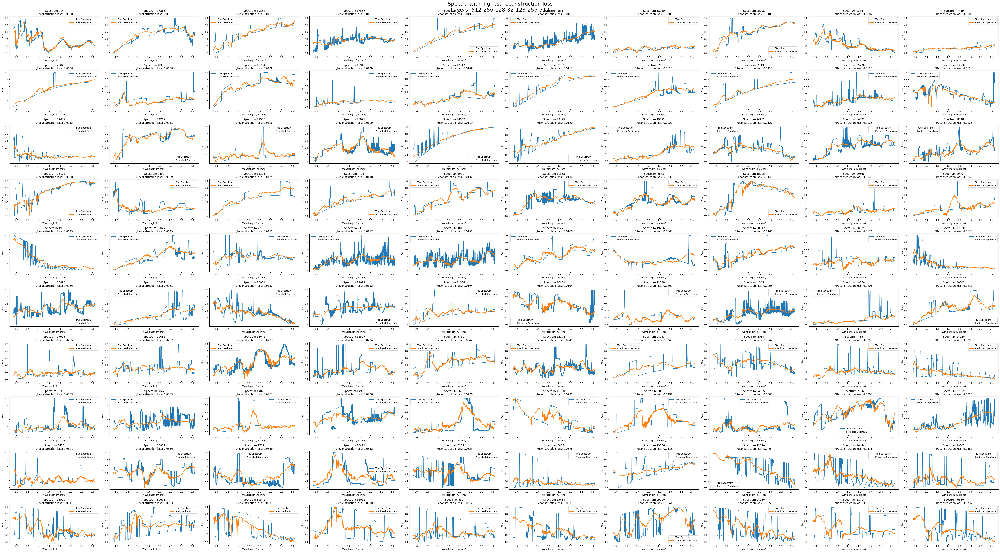

In [12]:
y_pred = autoencoder.predict(y_test)
reconstruction_loss = np.mean((y_pred - y_test)**2, axis=1)

wavelengths = np.linspace(0.95, 2.45, len(y_test[0]))

worst_indices = np.argsort(reconstruction_loss)[-100:]
fig, axs = plt.subplots(10, 10, figsize=(16*4, 9*4))
axs = axs.flatten()
for i, idx in enumerate(worst_indices):
    axs[i].plot(wavelengths, y_test[idx], label="True Spectrum")
    axs[i].plot(wavelengths, y_pred[idx], label="Predicted Spectrum")
    axs[i].set_title(f'Spectrum {idx}\n\Reconstruction loss: {reconstruction_loss[idx]:.4f}')
    axs[i].set_xlabel("Wavelength (microns)")
    axs[i].set_ylabel("Flux")
    axs[i].legend()
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.suptitle("Spectra with highest reconstruction loss\nLayers: 512-256-128-32-128-256-512", fontsize=24)
plt.savefig(figdir + 'autoencoder_worst_spectra_512_256_128_32_128_256_512.png')

In [13]:
worst_indices = np.argsort(reconstruction_loss)[-400:]

fig, axs = plt.subplots(20, 20, figsize=(16*1.5*4, 9*1.5*4))
axs = axs.flatten()
for i, idx in enumerate(worst_indices):
    axs[i].plot(wavelengths, y_test[idx], label="True Spectrum")
    axs[i].plot(wavelengths, y_pred[idx], label="Predicted Spectrum")
    axs[i].set_title(f'Spectrum {idx}\nReconstruction loss: {reconstruction_loss[idx]:.4f}')
    axs[i].set_xlabel("Wavelength (microns)")
    axs[i].set_ylabel("Flux")
    axs[i].legend()
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.suptitle("Spectra with highest reconstruction loss\nLayers: 512-256-128-32-128-256-512", fontsize=24)
plt.savefig(figdir + 'autoencoder_worst_spectra_512_256_128_32_128_256_512_400.png')